# Scatterplot all timepoints for single cells. Color graph by p65 stim and timepoints to see if any pattern exists

In [1]:
import numpy as np
import pandas as pd
import time
import os
import sys
from tqdm import tqdm, trange
from datetime import date
import nd2reader
from joblib import Parallel, delayed
import tifffile as tf
import xml.etree.ElementTree as ET
import napari
import skimage
from skimage.io import imread
from skimage.measure import block_reduce
from skimage.filters import try_all_threshold
import dask.array as da
import dask.dataframe as dd
from dask.diagnostics import ProgressBar
import dask
import matplotlib
import matplotlib.pyplot as plt
import nd2
from skimage import exposure, restoration
import torch
from cellpose import models, core, plot
import cv2
import scipy
import seaborn as sns
from sklearn.metrics import r2_score
from datetime import datetime
from skimage.morphology import closing, square
from skimage.measure import label
from pathlib import Path

sns.set(font_scale = 2)
sns.set_style('whitegrid')
np.random.seed(0)

c:\Users\nzhang326\AppData\Local\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# directories and inputs

In [2]:
# drugs vs control
dataPath = Path.cwd().parent / 'data'
assert dataPath.exists()

# folder to save graph screenshots
screenshotSavePath = Path.cwd().parent / 'figures'
assert screenshotSavePath.exists()

idCols = ['Z', 'Y', 'X', 'CellLabel', 'MaskCytoLabel', 'MaskNucLabel', 'Cycle', 
          'Stim', 'NucCount', 'MaskNucMembLabel', 'FOV', 'CellRegion', 
          'TimeStamp', 'Drug', 'AntiCorr']

# Read single cell data

In [3]:
dfCell = pd.read_hdf(dataPath / '03_scatter_timePts.h5',
                     key = 'df')
dfCell

,CellLabel,Stim,CellSize,DAPI,H2B,p65 Protein,p65 RNA Dots,p65 RNA Intensity,GAPDH RNA Dots,GAPDH RNA Intensity,A20 Protein,Segmentation Abs,IKBa Protein,Drug,TimeStamp
0,1,Non Responding,17702,21534438.0,2890692.0,2460063.0,0.0,368045.0,0.0,385275.0,960618.0,3745154.0,435008.0,TNFa,0
1,3,Partially Responding,19963,20466847.0,3663314.0,3387409.0,0.0,425674.0,0.0,432065.0,1416918.0,4623487.0,496083.0,TNFa,0
2,4,Non Responding,187007,258118318.0,34405937.0,29753599.0,23.0,3758119.0,6.0,4139037.0,13515082.0,40886397.0,4634898.0,TNFa,0
3,5,Partially Responding,41003,47578286.0,6991111.0,6366205.0,8.0,815507.0,10.0,1145135.0,3890943.0,11343952.0,1048508.0,TNFa,0
4,6,Non Responding,153975,172382113.0,30976555.0,25598619.0,31.0,3245658.0,33.0,4134620.0,12133131.0,36861599.0,4001457.0,TNFa,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32,61882,Fully Responding,18125,7680740.0,3694618.0,3271946.0,38.0,399530.0,15.0,552950.0,674234.0,1268856.0,328946.0,Unstimulated Baseline,105
33,61884,Fully Responding,13614,11095308.0,4479298.0,4392459.0,13.0,378946.0,6.0,571727.0,482461.0,824252.0,238949.0,Unstimulated Baseline,105
34,61897,Partially Responding,8240,2441660.0,2062123.0,1259010.0,8.0,167396.0,8.0,249330.0,271018.0,478444.0,135894.0,Unstimulated Baseline,105
35,61902,Fully Responding,24321,13757358.0,7397099.0,4218331.0,19.0,689015.0,38.0,1100064.0,1170075.0,1347303.0,421279.0,Unstimulated Baseline,105


# Plot bar graphs of all timepoints and stimulations

In [4]:
def saveFigLabelTime(fig, title): # save figure with current time as label
    now = datetime.now()
    now = now.strftime('%d%b%Y_%H%M%S')
    fileOut = title + '.png'
    fileOut = os.path.join(screenshotSavePath, fileOut)
    fig.savefig(fileOut, dpi = 'figure', bbox_inches = 'tight', pad_inches = 0)

    # wait so figures do not overwrite each other
    time.sleep(2)
    
    return None

# Separate scatter plots by timepoint. Compute p65 RNA and protein $R^2$ correlations at each timepoint

In [5]:
# linear fit
def linFit(x, m, b):
    y = m * x + b   
    return y

  0%|          | 0/3 [00:00<?, ?it/s]

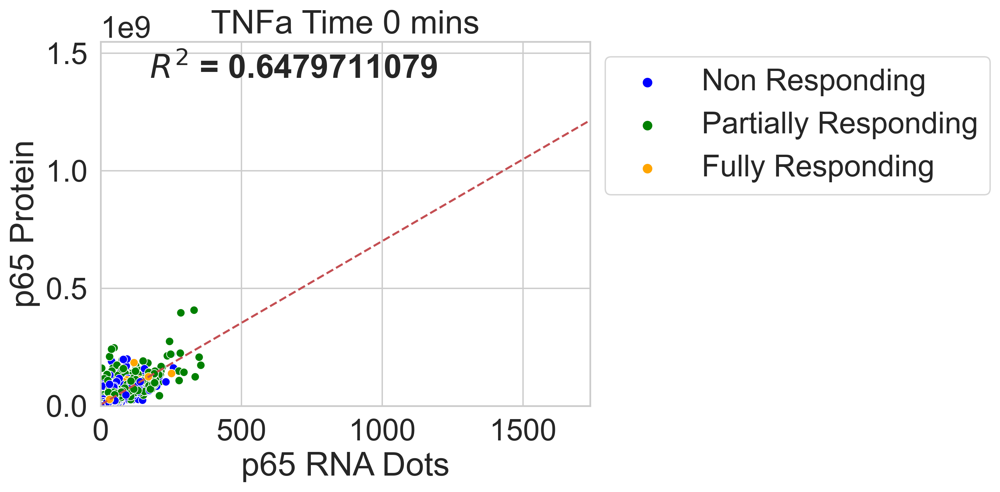

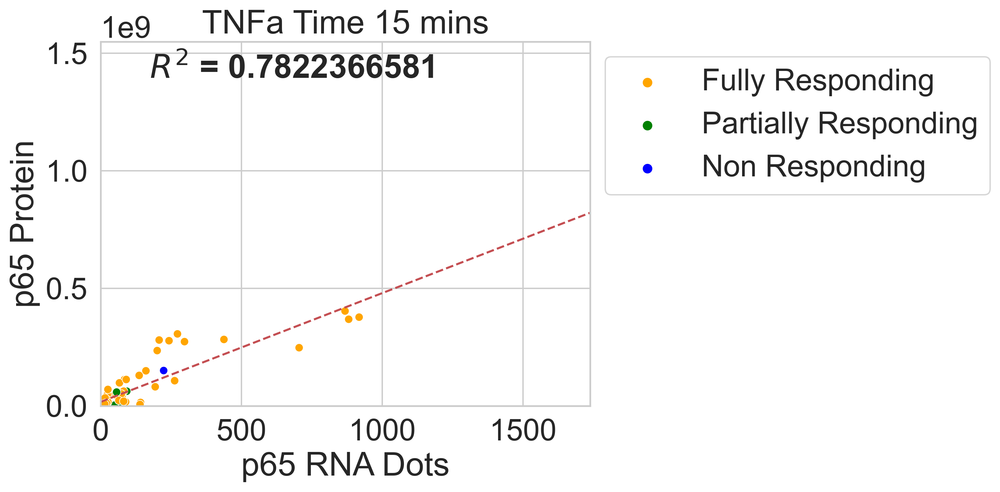

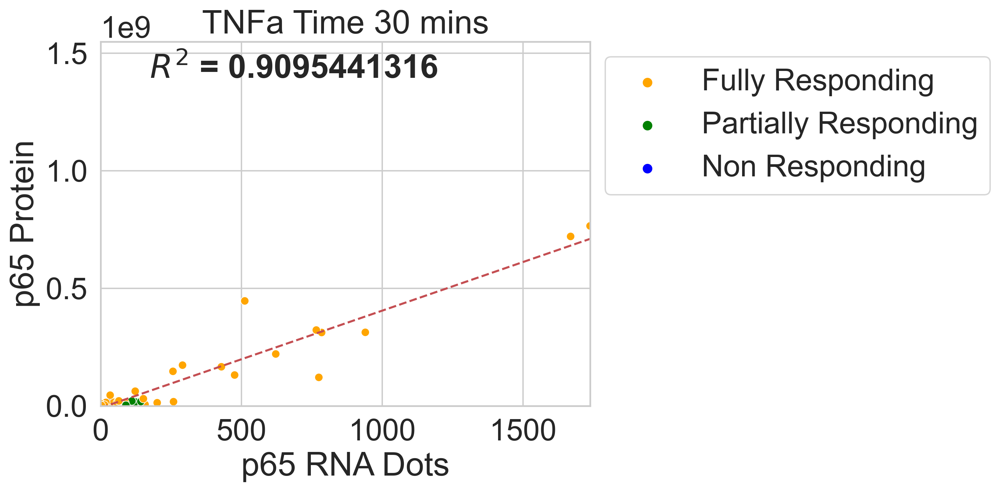

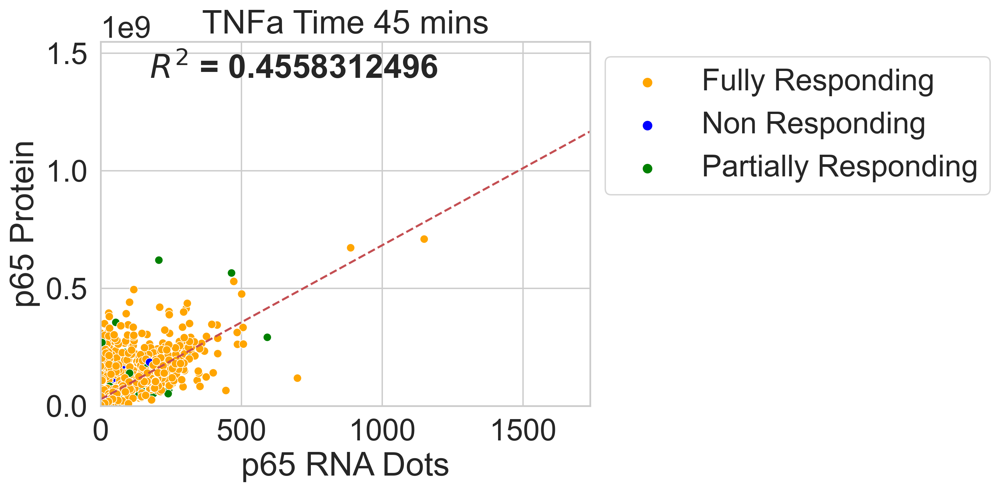

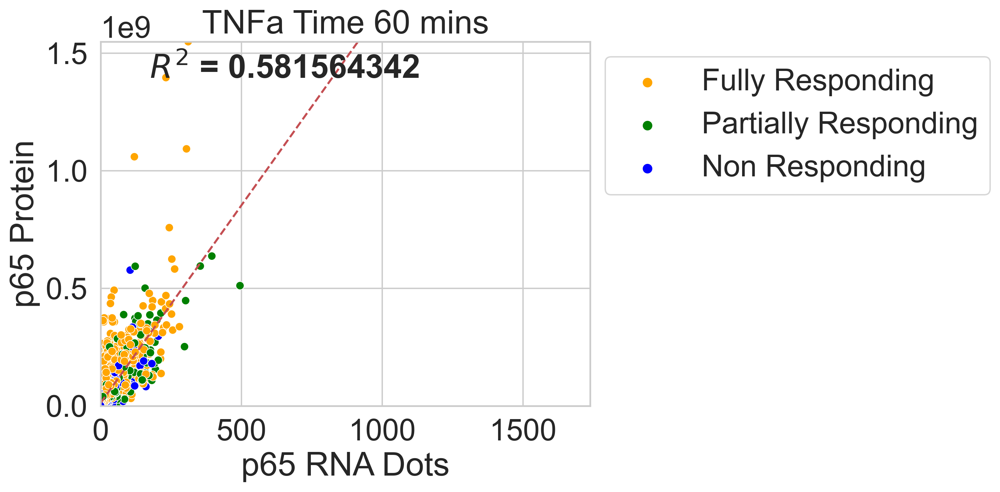

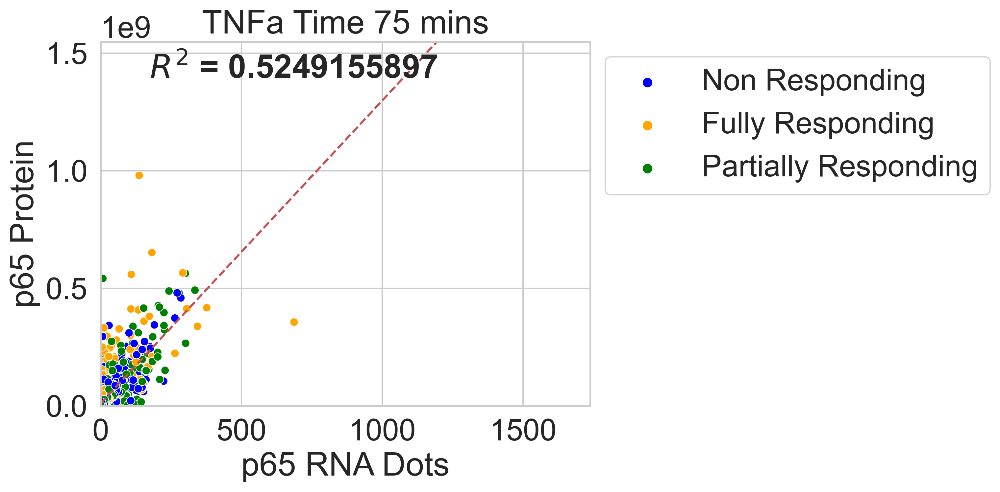

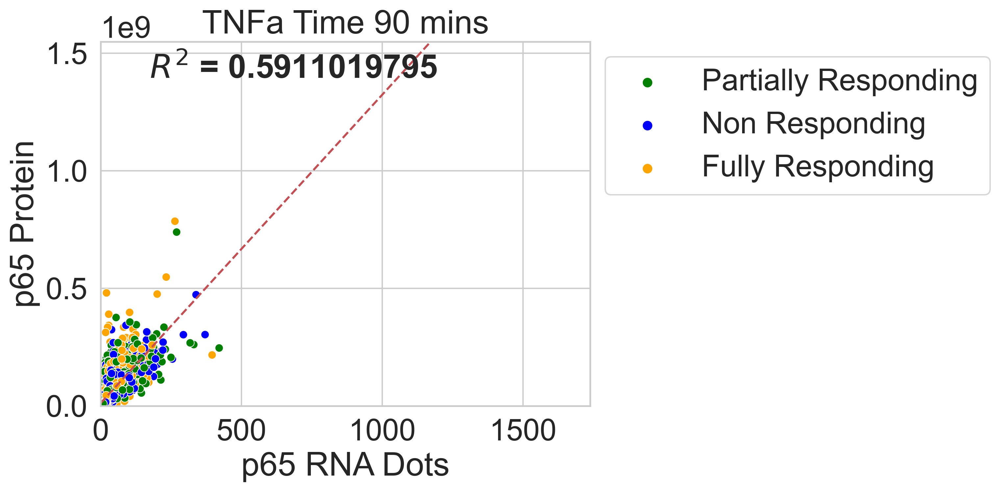

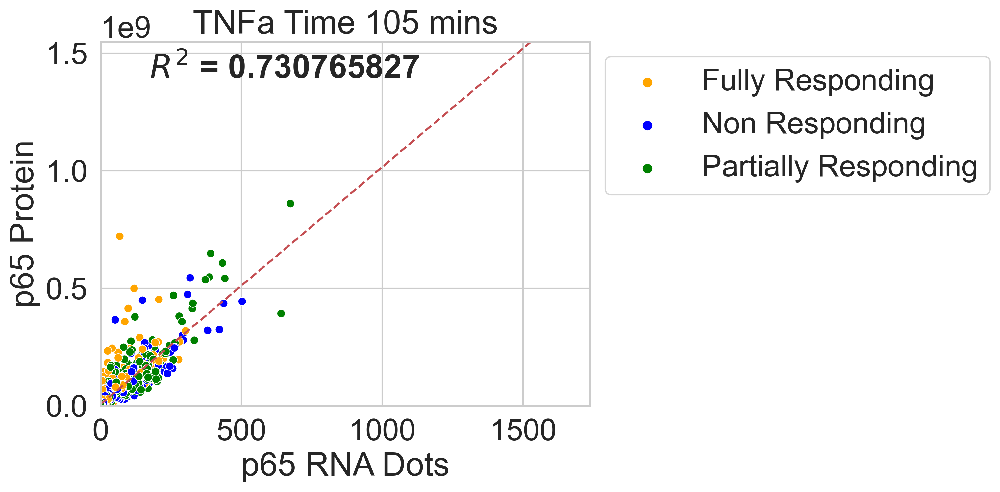

 33%|███▎      | 1/3 [00:23<00:46, 23.31s/it]

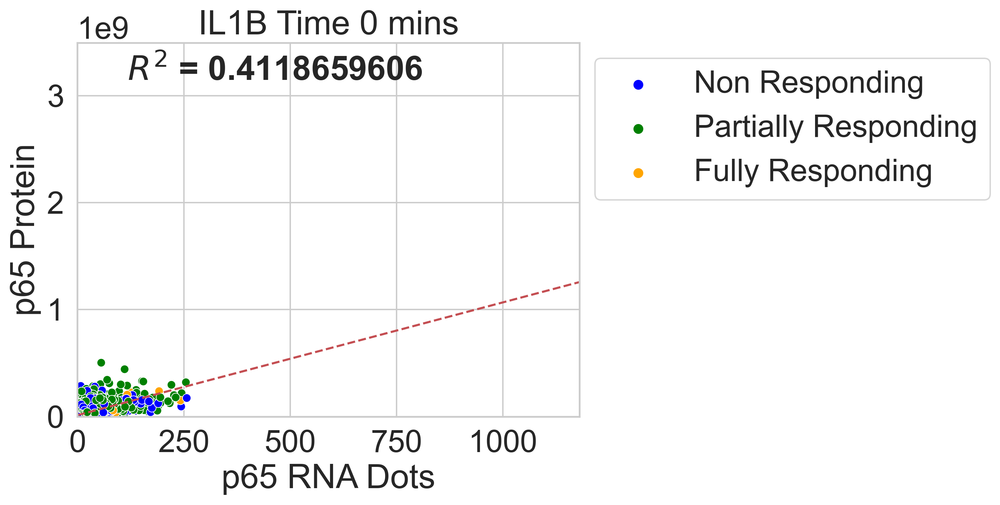

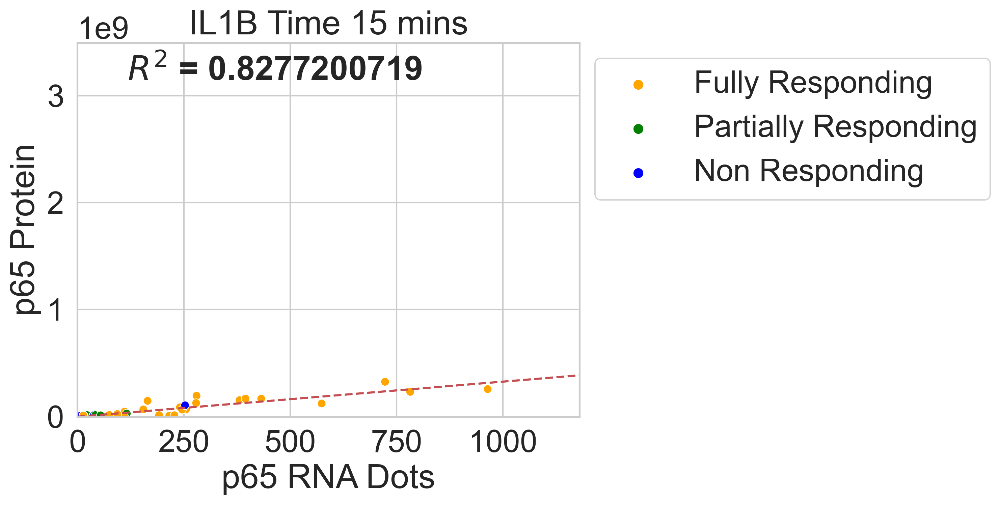

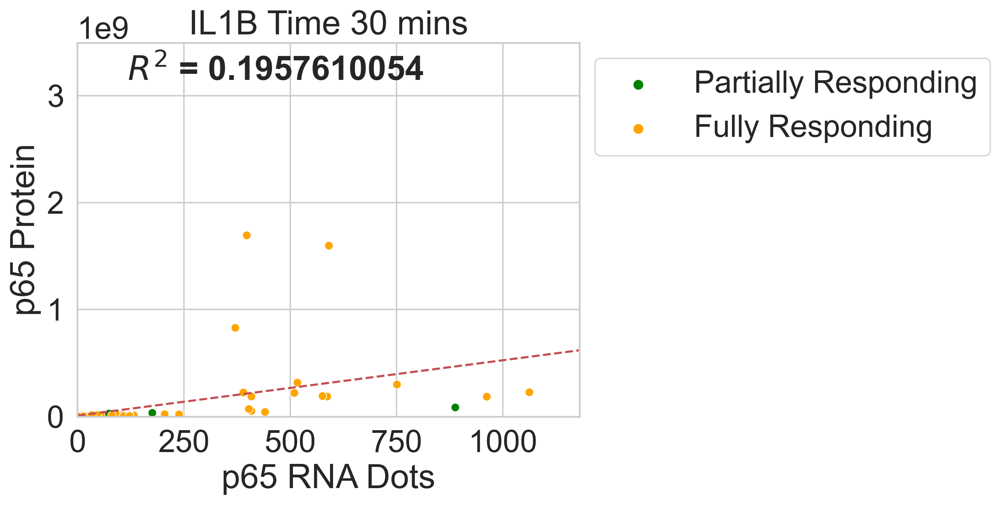

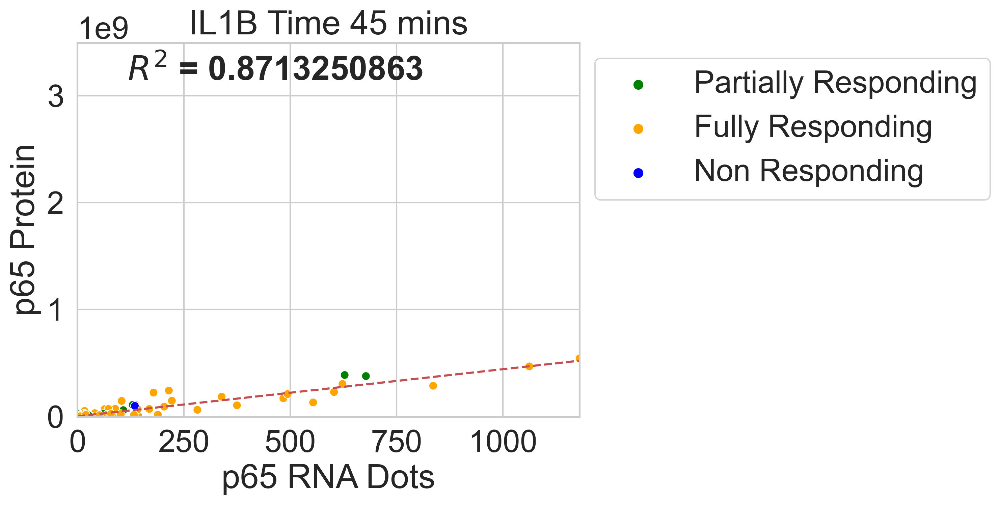

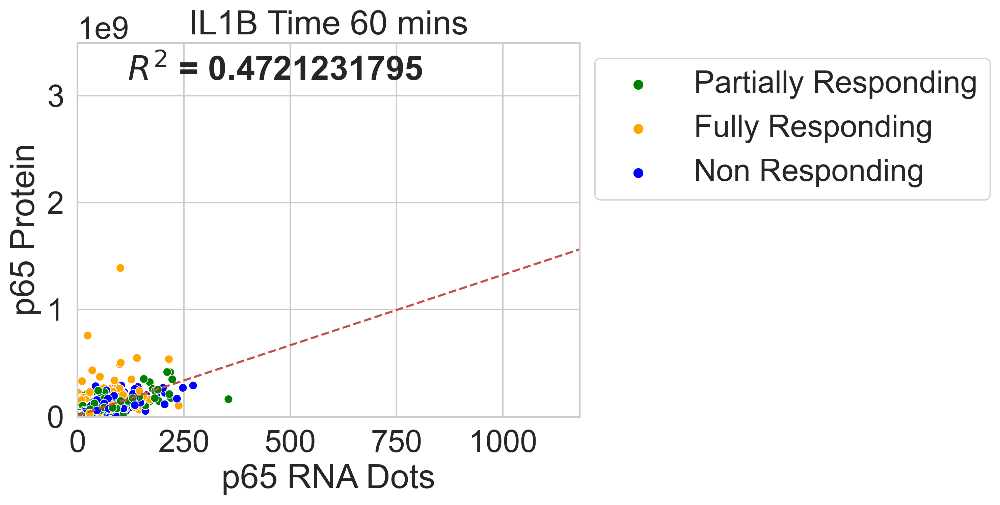

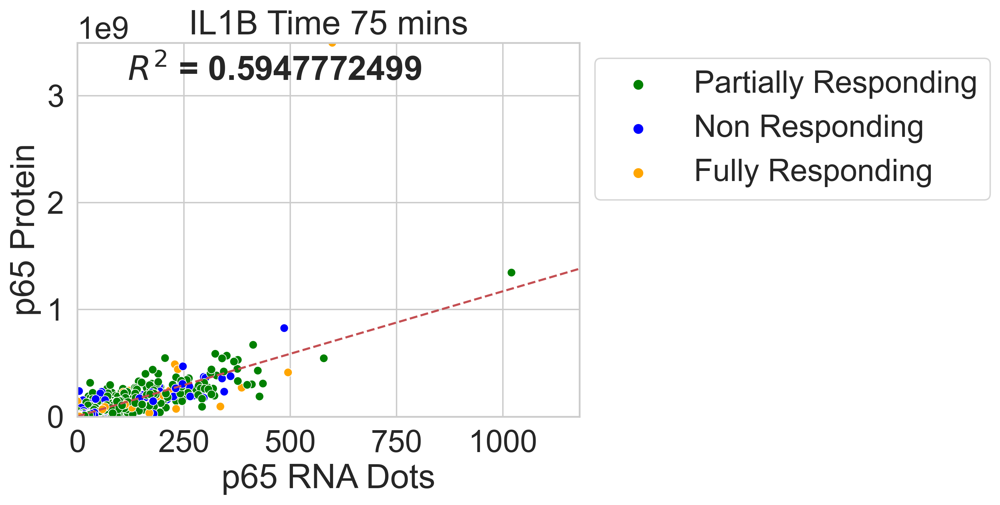

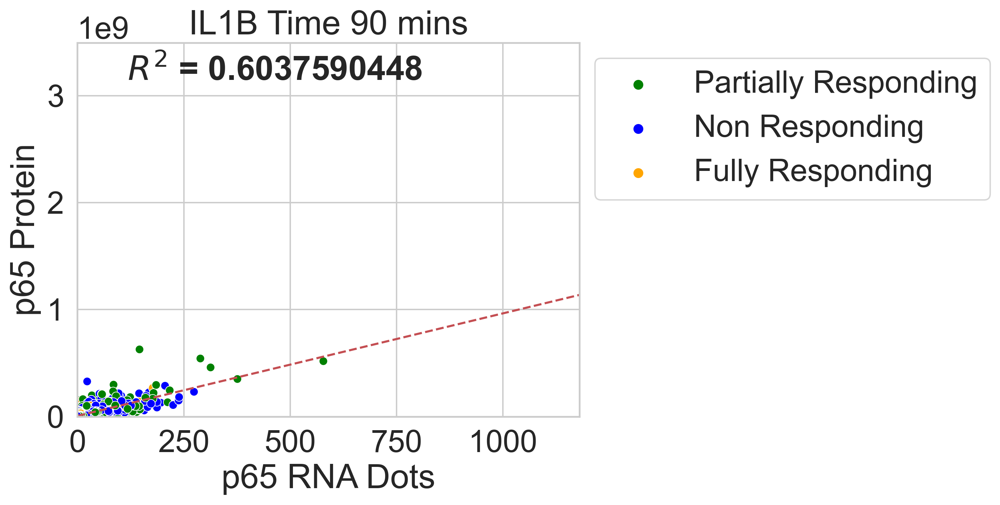

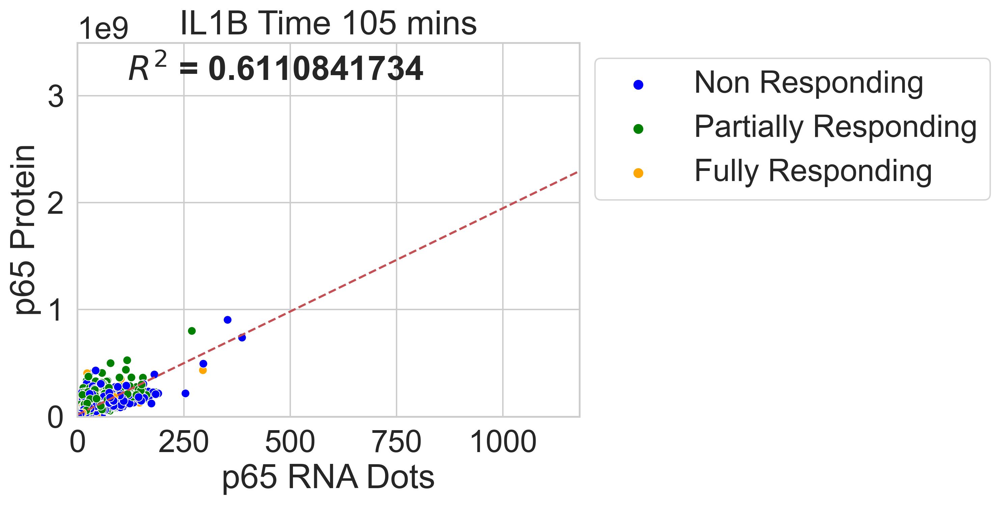

 67%|██████▋   | 2/3 [00:46<00:22, 22.99s/it]

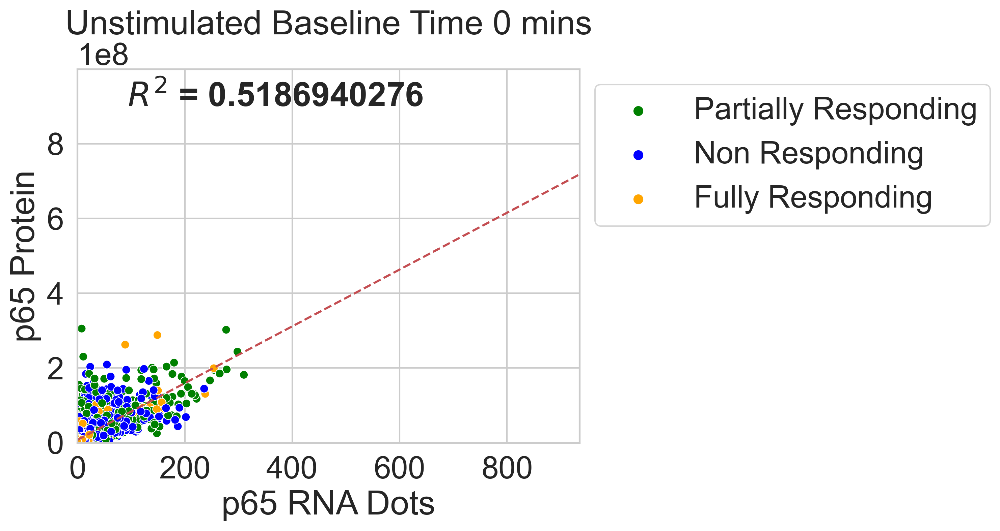

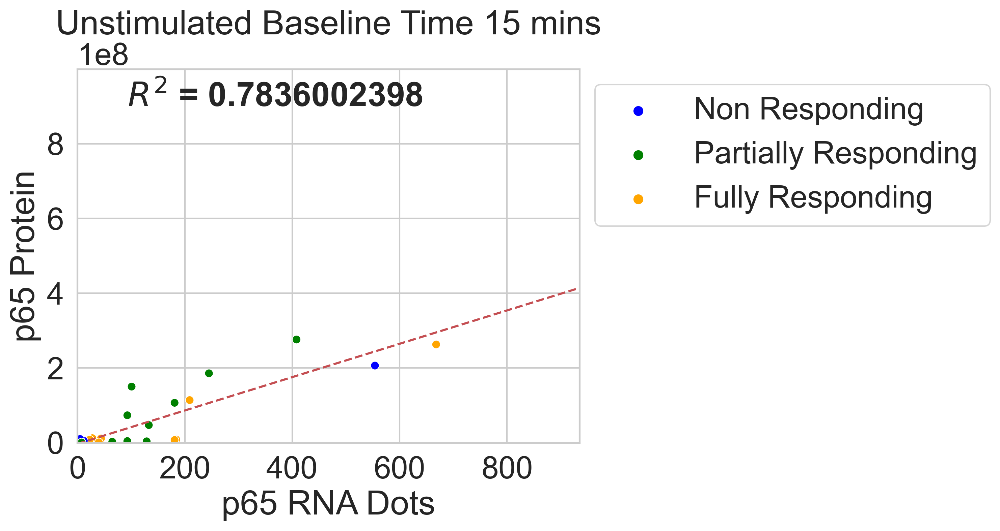

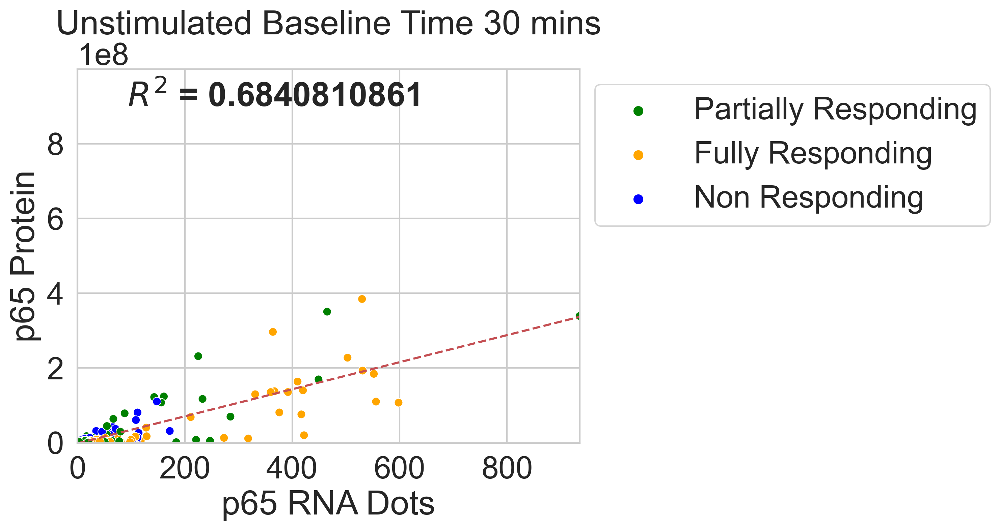

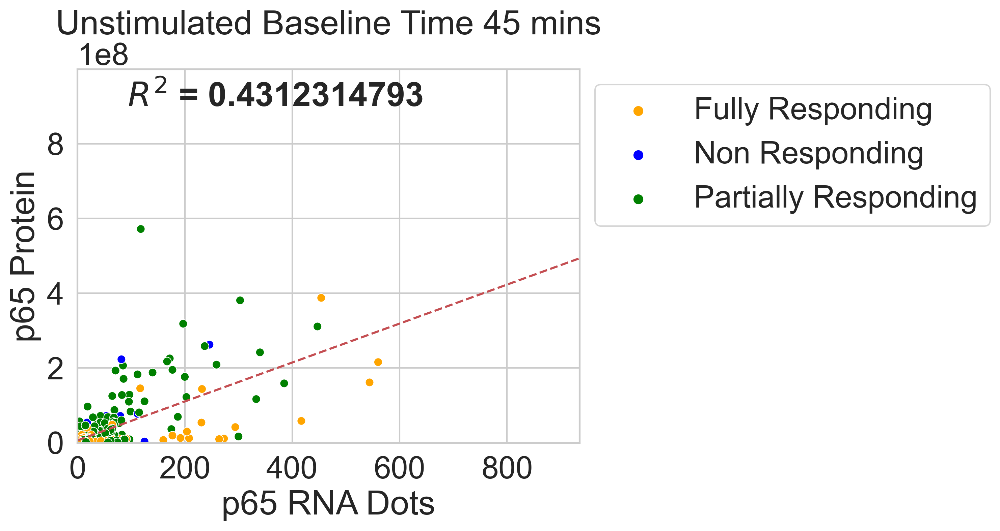

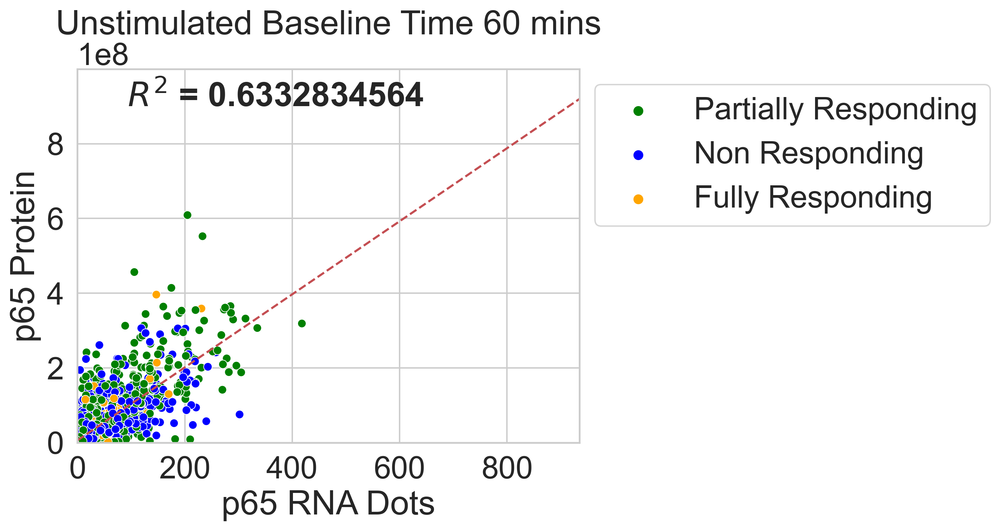

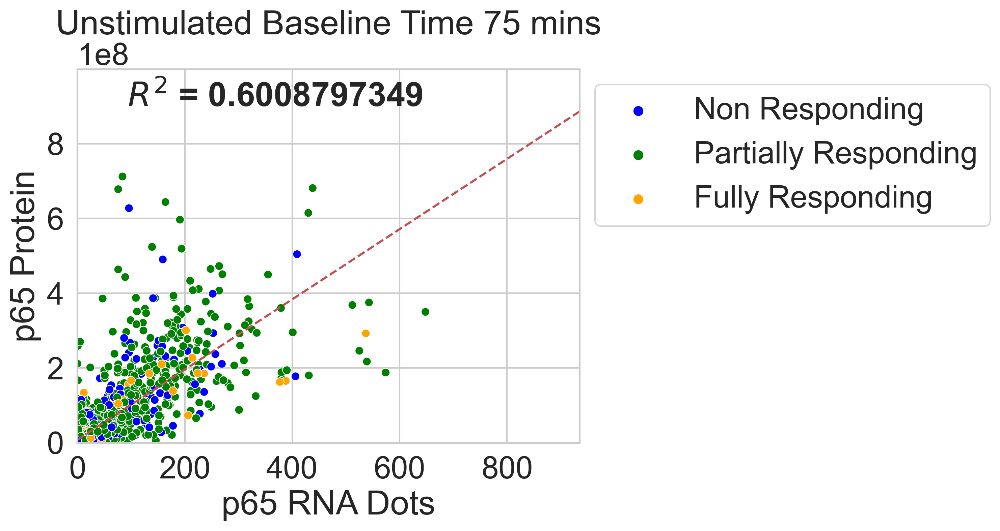

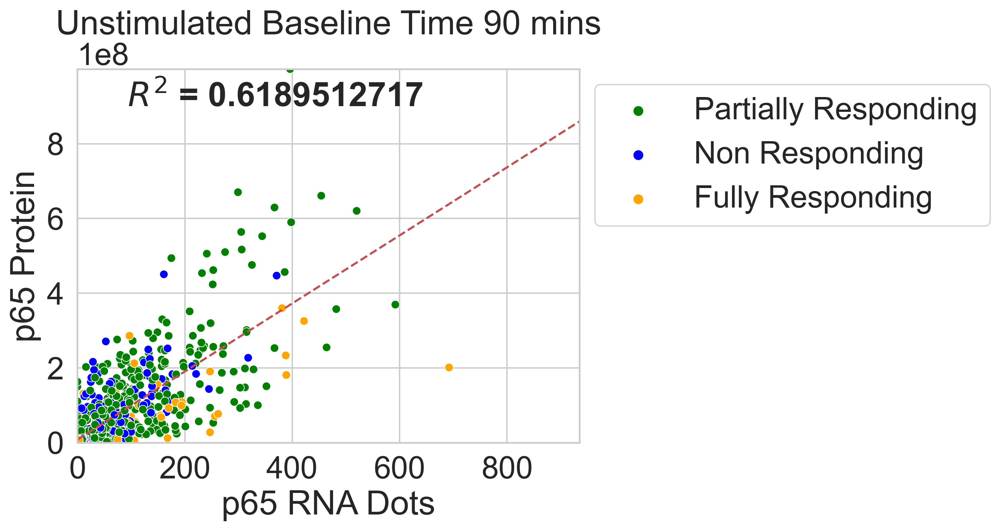

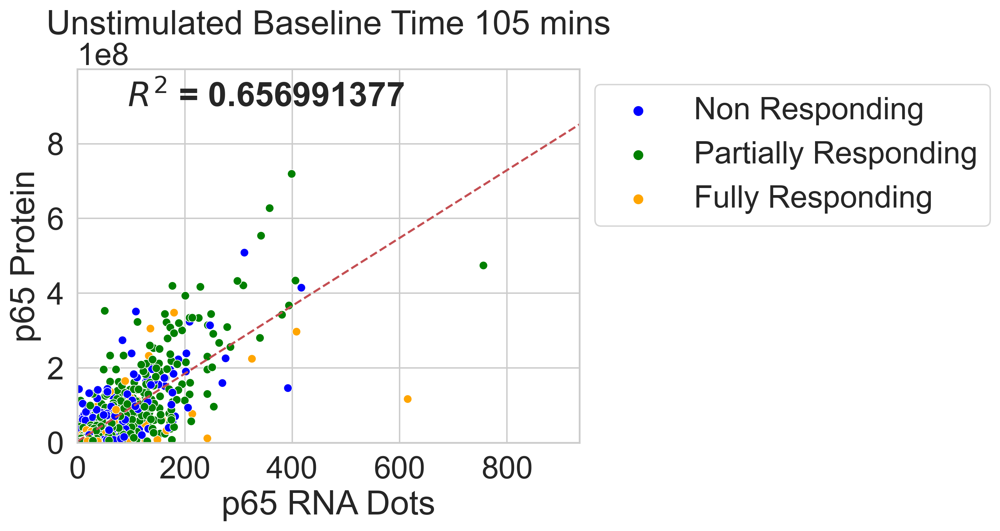

100%|██████████| 3/3 [01:09<00:00, 23.01s/it]


In [6]:
x = 'p65 RNA Dots'
y = 'p65 Protein'
hue = 'Stim'

# define colormap for stimulation levels
palette = {'Non Responding': 'blue', 
          'Partially Responding': 'green', 
          'Fully Responding': 'orange'}

for ii, drug in enumerate(tqdm(dfCell['Drug'].unique())): # each drug

    dfDrug = dfCell.loc[dfCell['Drug'] == drug]

    for _, timeStamp in enumerate(dfDrug['TimeStamp'].unique()): # each unique timepoint
        
        dfTime = dfDrug.loc[dfDrug['TimeStamp'] == timeStamp]
        
        fig, ax = plt.subplots(dpi = 300)
        sns.scatterplot(data = dfTime, x = x, y = y, hue = hue, ax = ax, palette = palette)
        ax.set_title(drug + ' Time ' + str(timeStamp) + ' mins')
        
        # standardize axes limits
        ax.set_xlim(0, dfDrug[x].max())
        ax.set_ylim(0, dfDrug[y].max())
        
        # linear curve fit
        # p0 = [1, 1] # initial guess
        weights, _ = scipy.optimize.curve_fit(linFit, dfTime[x], dfTime[y])

        # plot linear fit
        yPred = linFit(dfTime[x], *weights)
        # plot line for entire domain
        domain = np.round(ax.get_xlim())
        sns.lineplot(x = domain, y = linFit(domain, *weights), 
                    label = '__Linear Fit', ls = '--', color = 'r', ax = ax)

        # R^2 coef
        r2 = r2_score(dfTime[y], yPred)
        ax.text(0.1, 0.9, '$R^{2}$ = ' + str(round(r2, 10)), transform = ax.transAxes, 
                fontsize = 24, fontweight = 'bold')
    #     # pearsons corr
    #     pearson, _ = scipy.stats.pearsonr(dfTime[x], dfTime[y])
    #     ax.text(0.1, 0.9, 'Pearson = ' + str(round(pearson, 10)), transform = ax.transAxes, 
    #             fontsize = 24, fontweight = 'bold')
            
        # move legend outside
        ax.legend(bbox_to_anchor = [1, 1], loc = 'upper left')
                
        # save fig
        saveFigLabelTime(fig, title = drug + '_Time_' + str(timeStamp) + 'mins')
        plt.show()

# Separate scatter plots by timepoint. Compute p65 RNA and protein $R^2$ correlations at each timepoint. Normalize p65 RNA and protein axes to cell size

In [7]:
# normalize p65 RNA and protein to cell size
dfNorm = dfCell.copy(deep=True)
dfNorm['p65 RNA Dots Norm'] = np.true_divide(dfNorm['p65 RNA Dots'], dfNorm['CellSize'])
dfNorm['p65 Protein Norm'] = np.true_divide(dfNorm['p65 Protein'], dfNorm['CellSize'])

  0%|          | 0/3 [00:00<?, ?it/s]

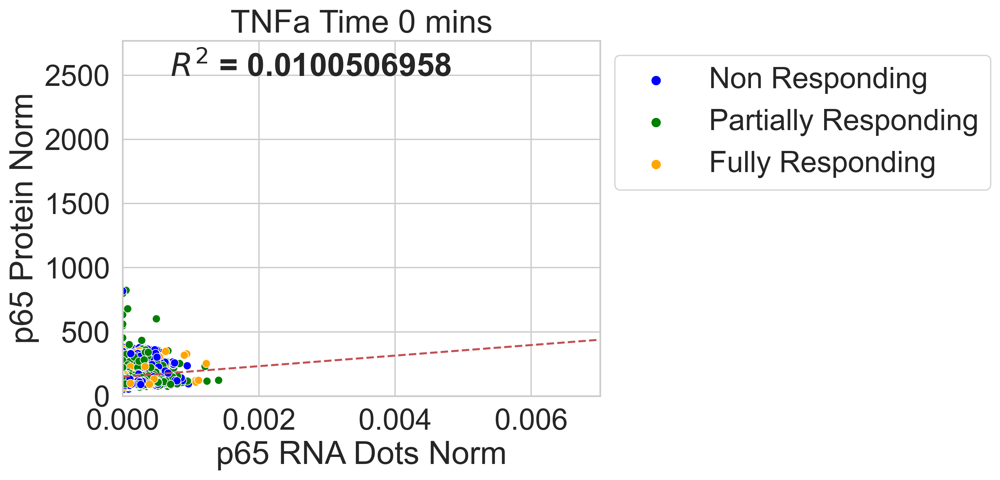

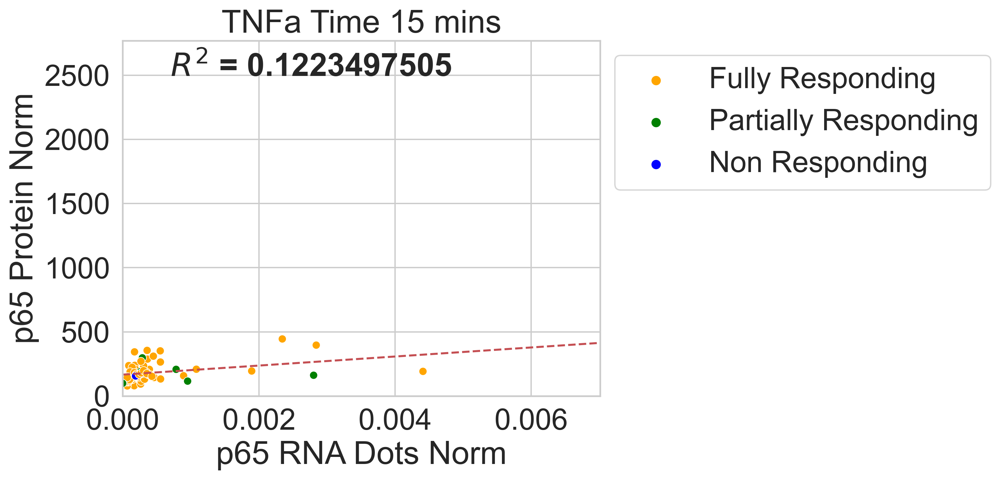

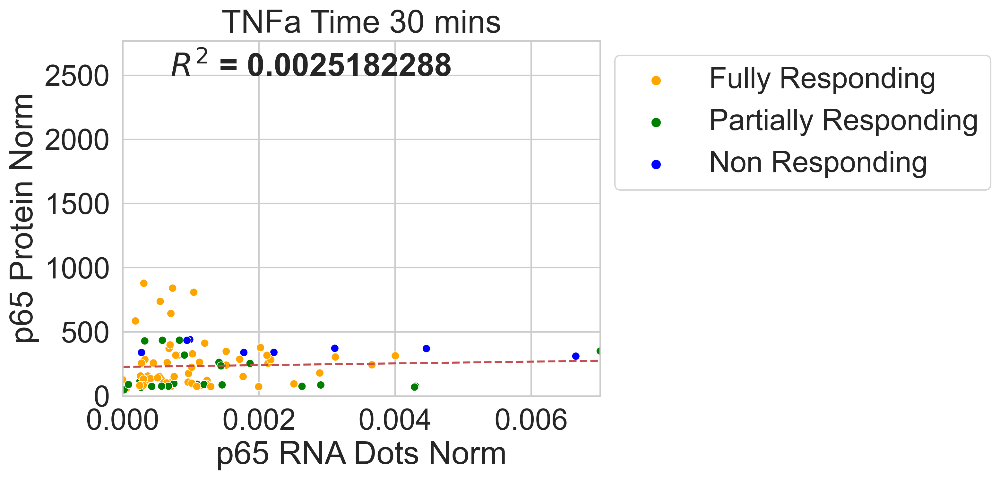

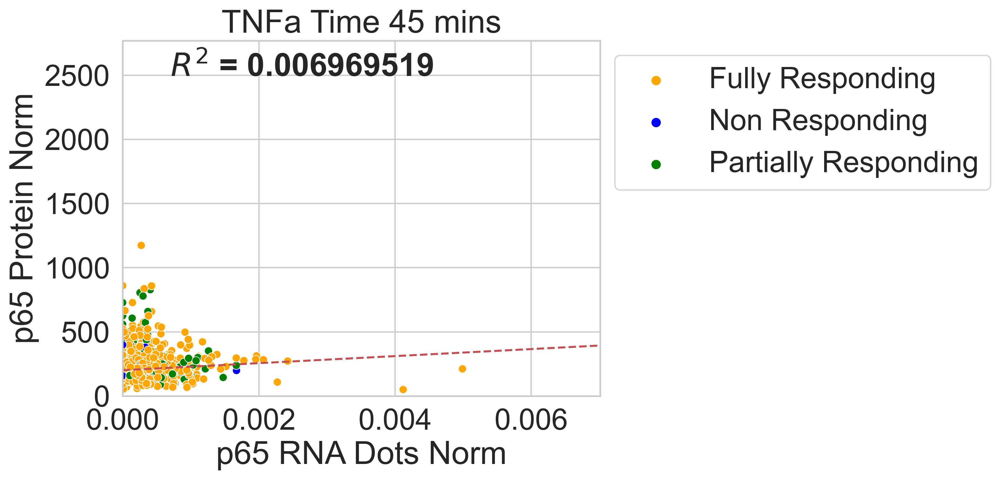

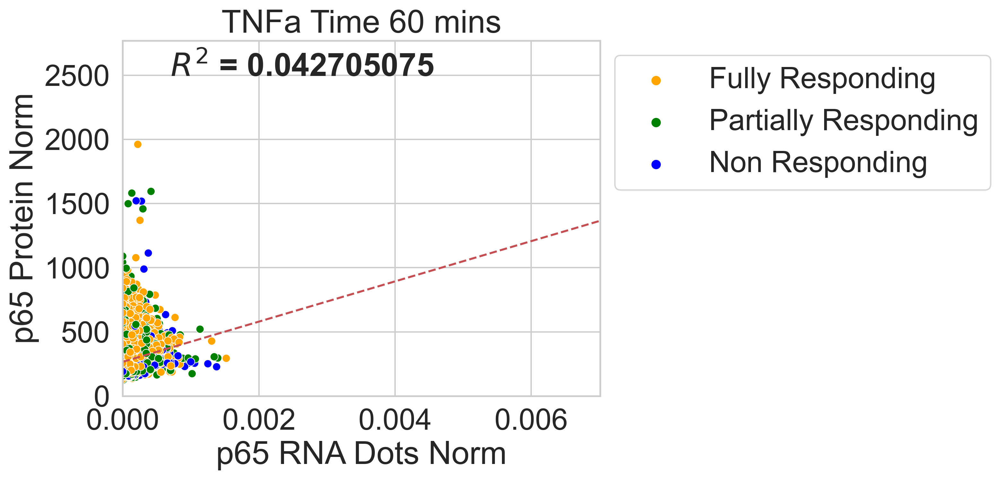

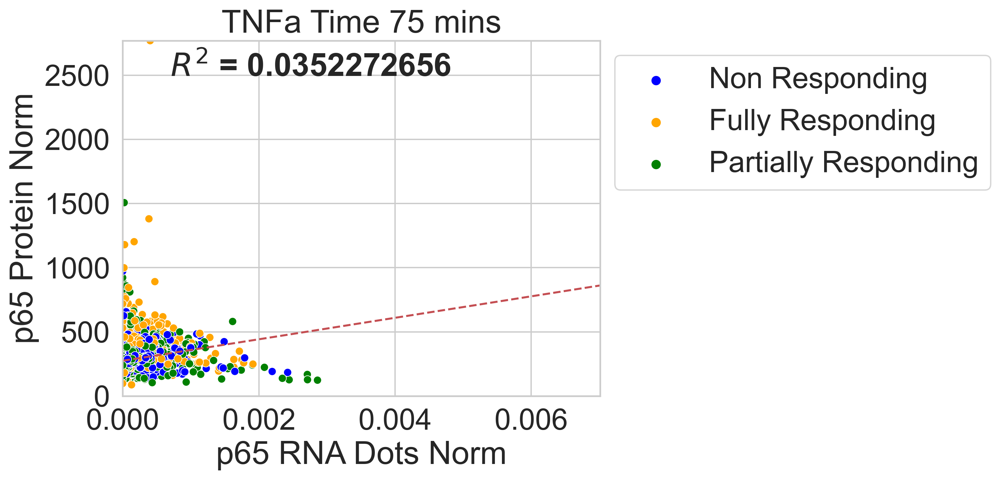

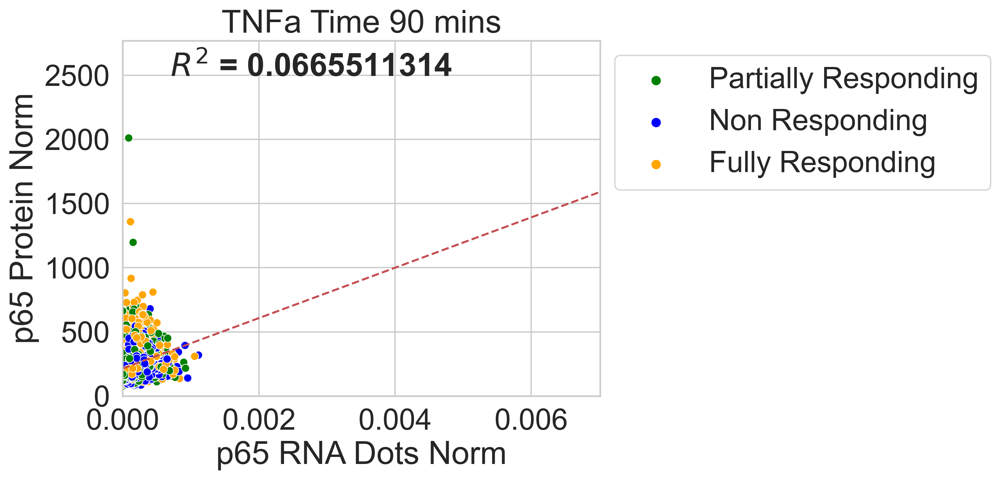

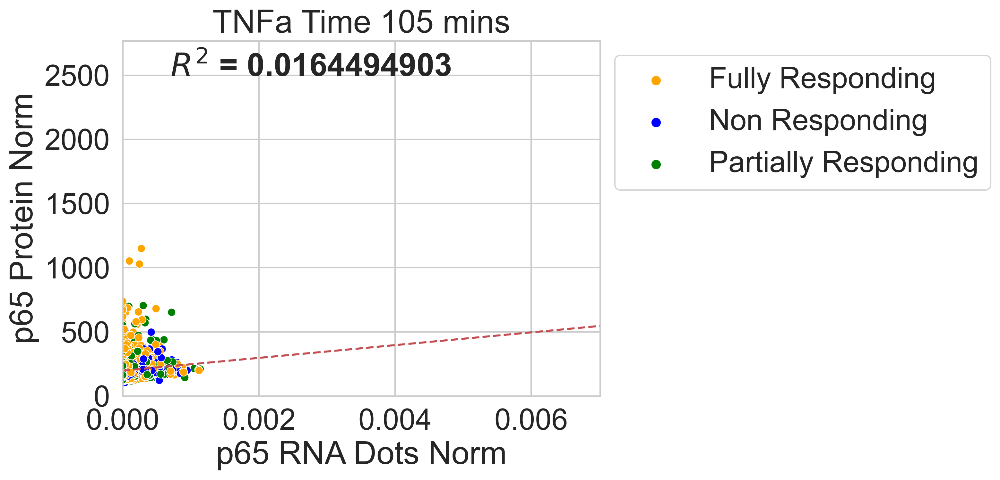

 33%|███▎      | 1/3 [00:23<00:46, 23.47s/it]

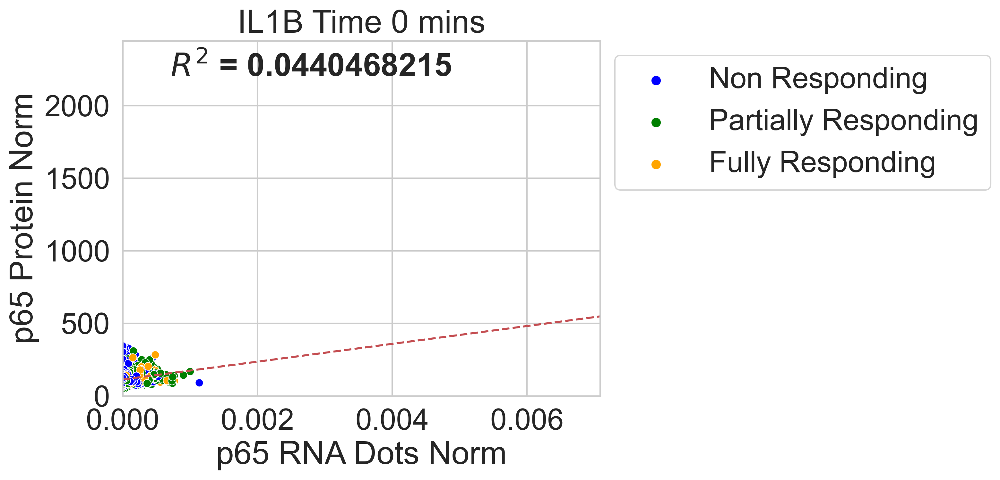

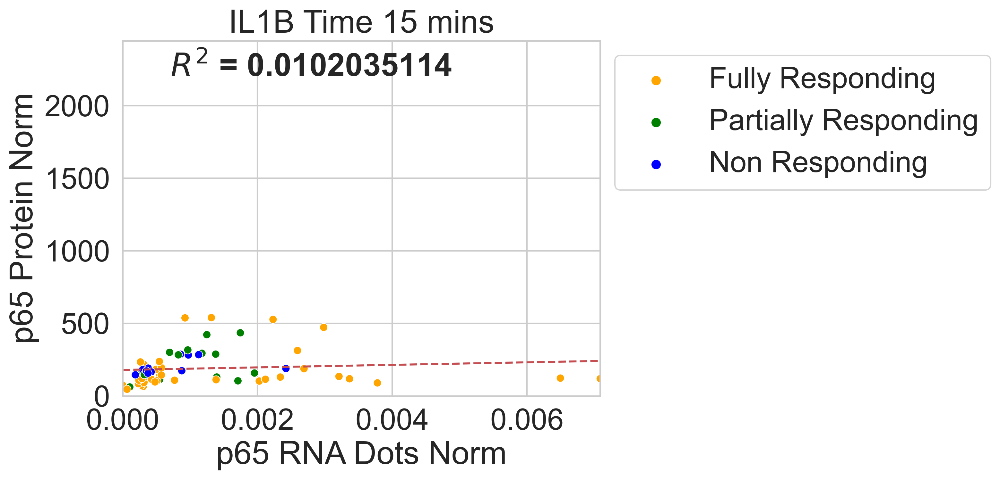

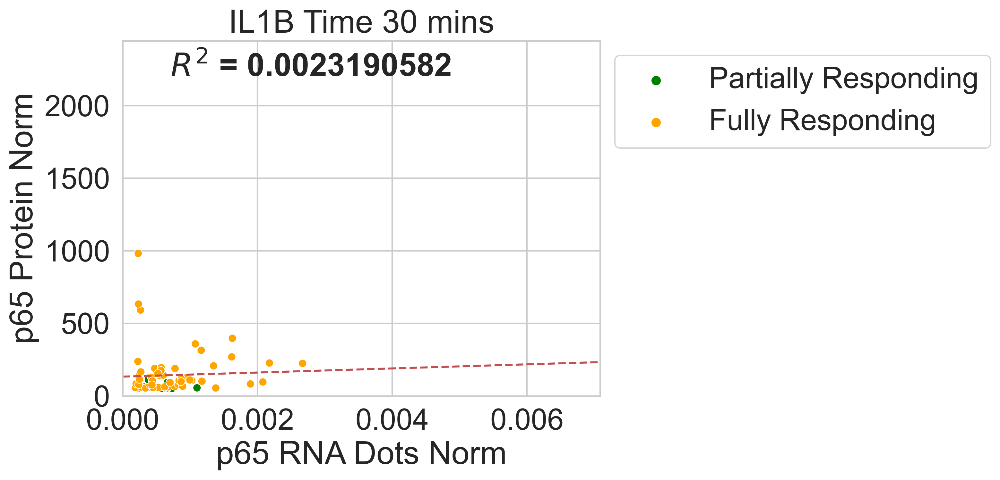

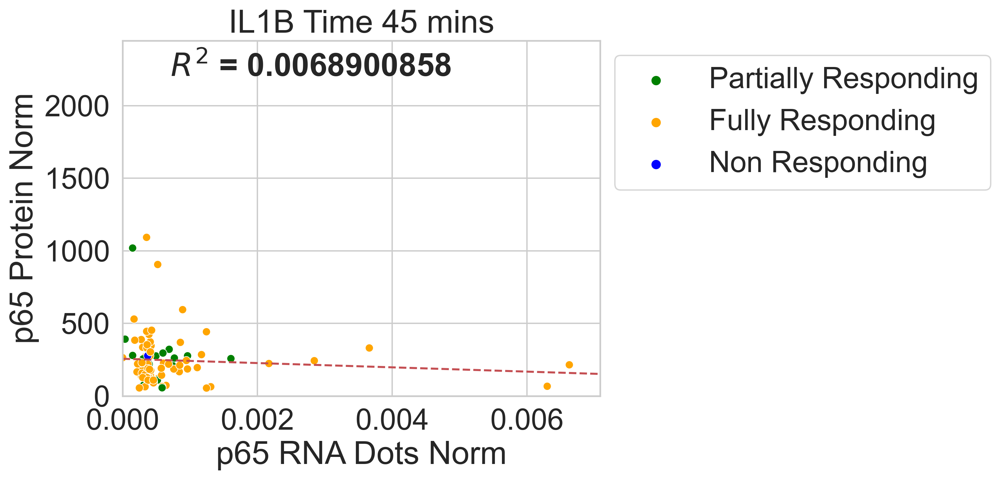

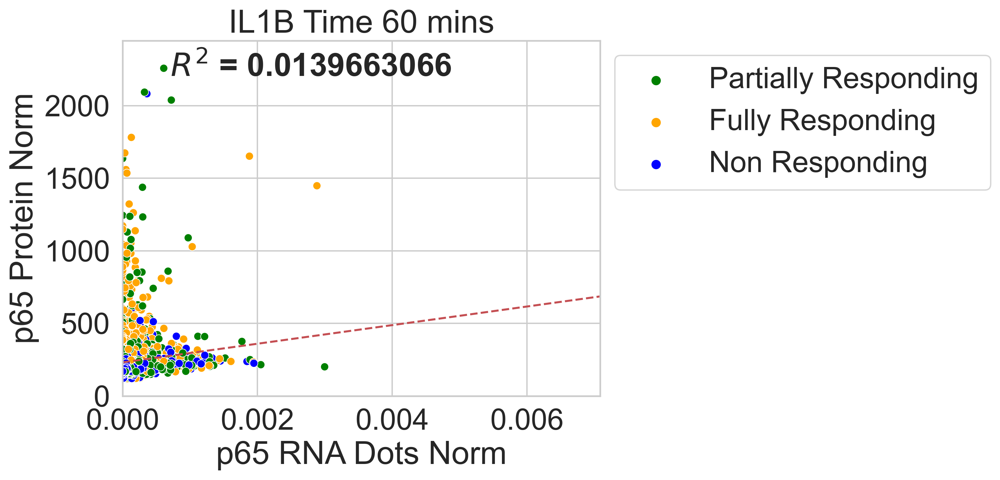

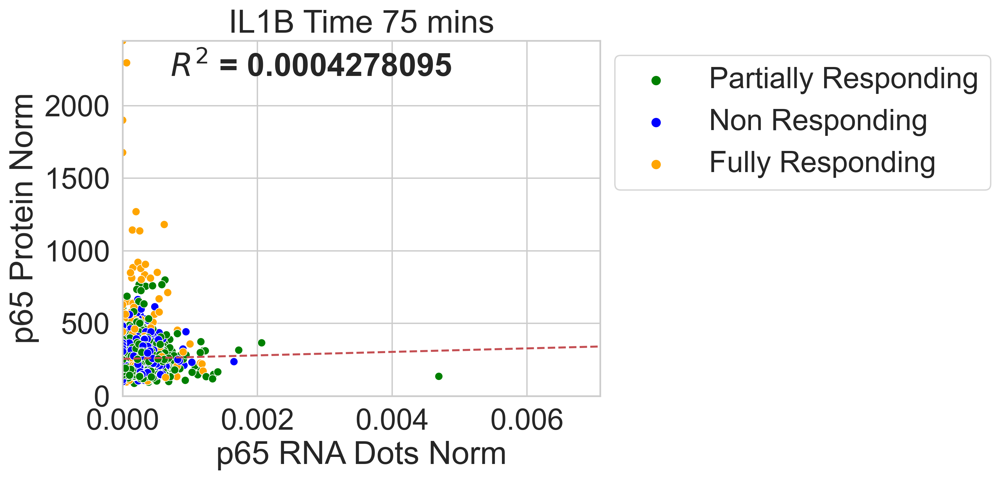

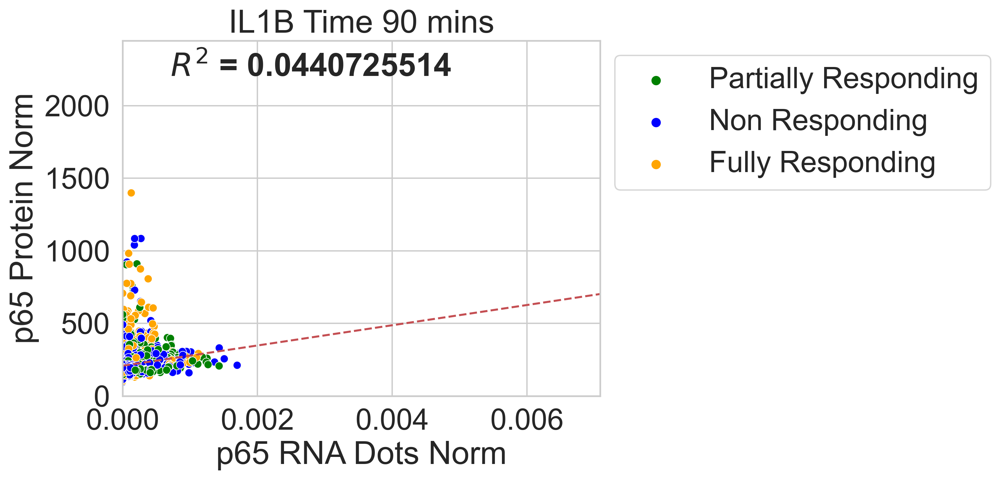

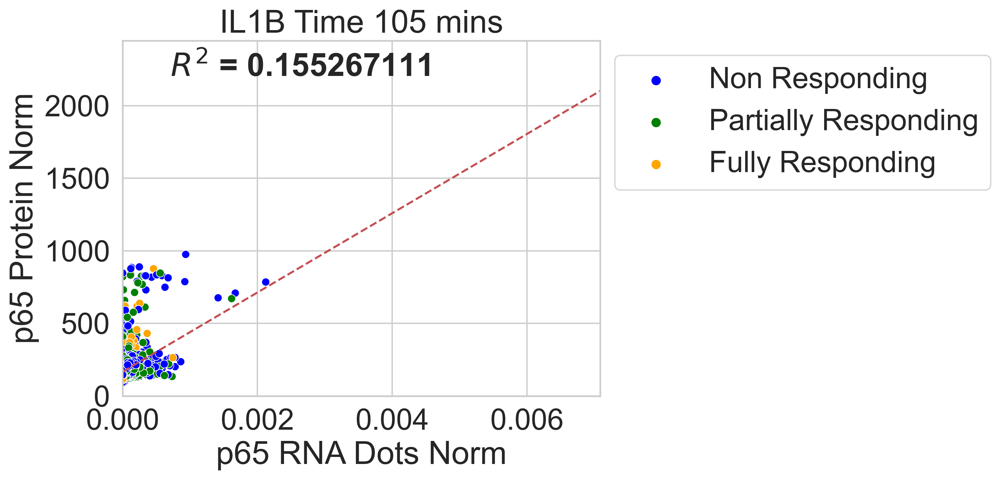

 67%|██████▋   | 2/3 [00:46<00:23, 23.43s/it]

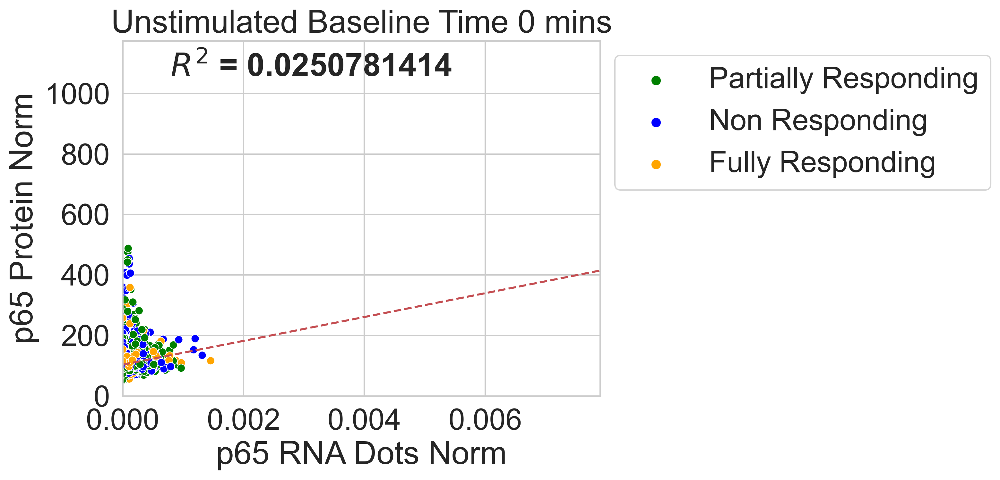

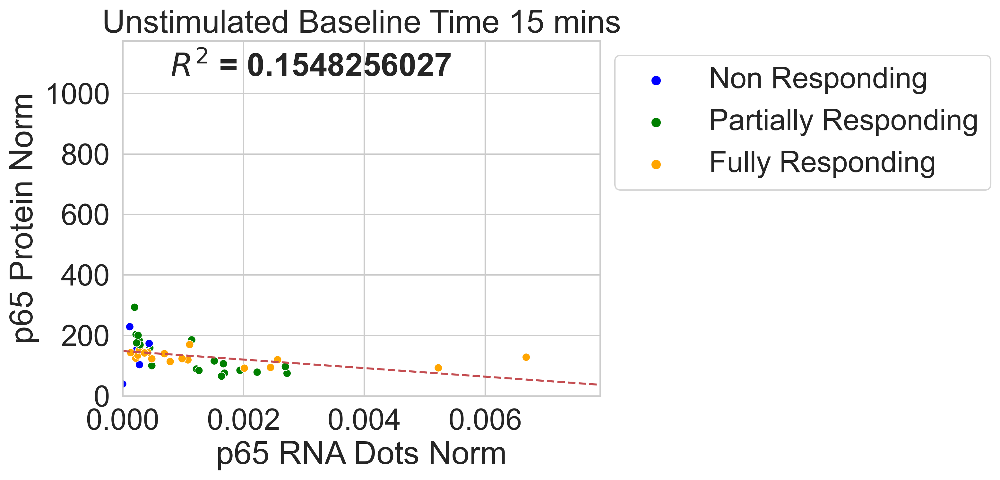

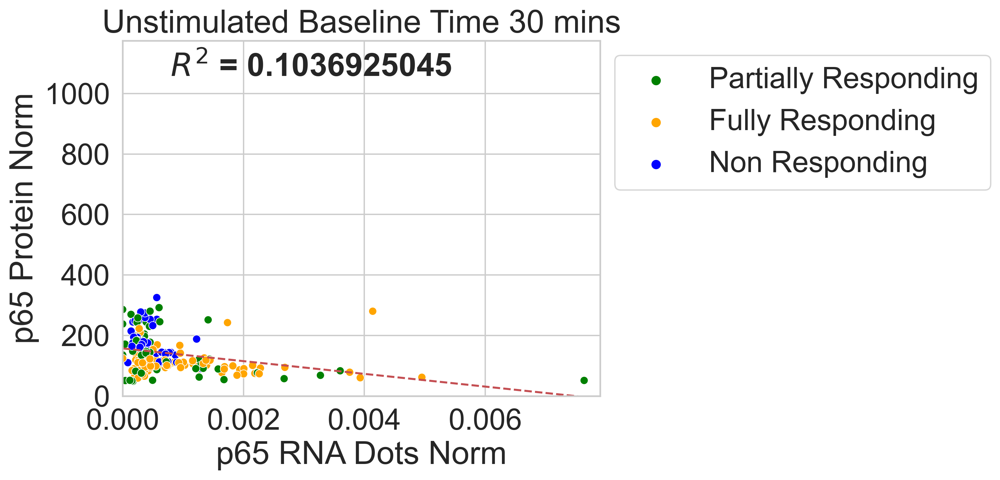

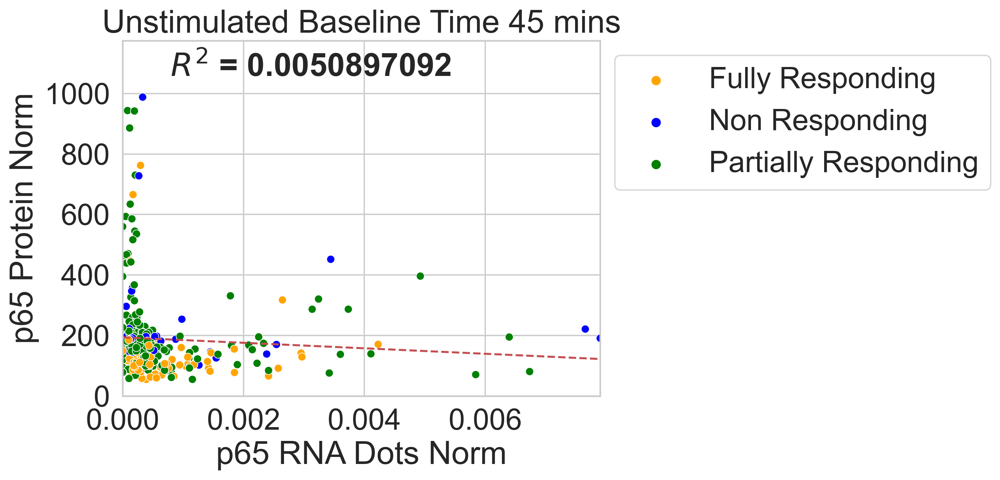

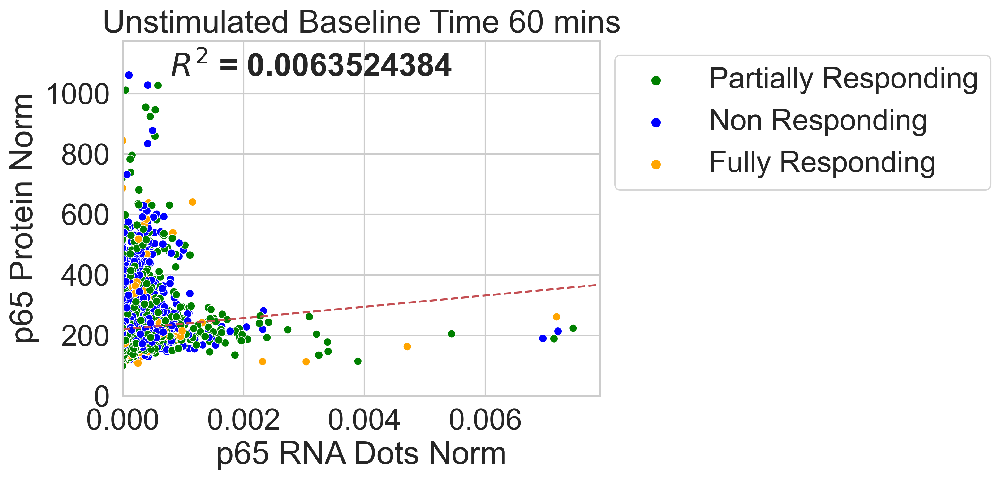

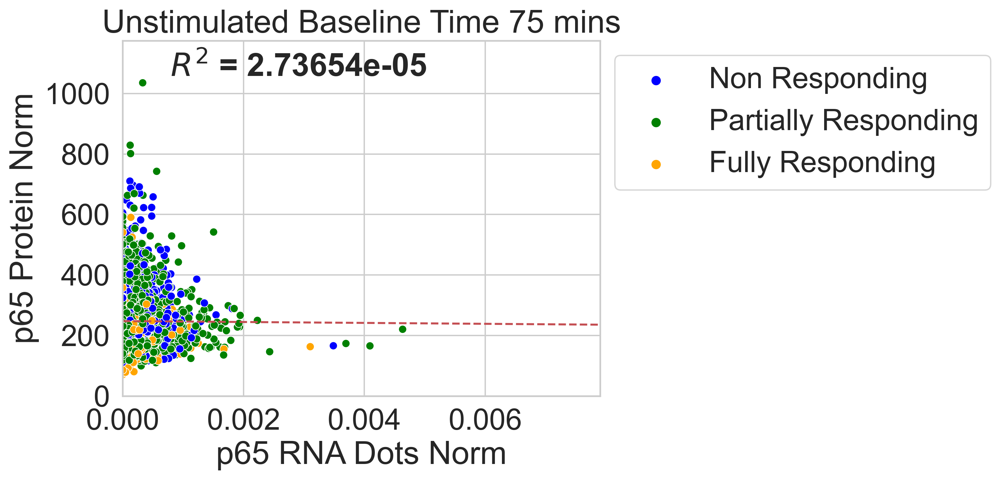

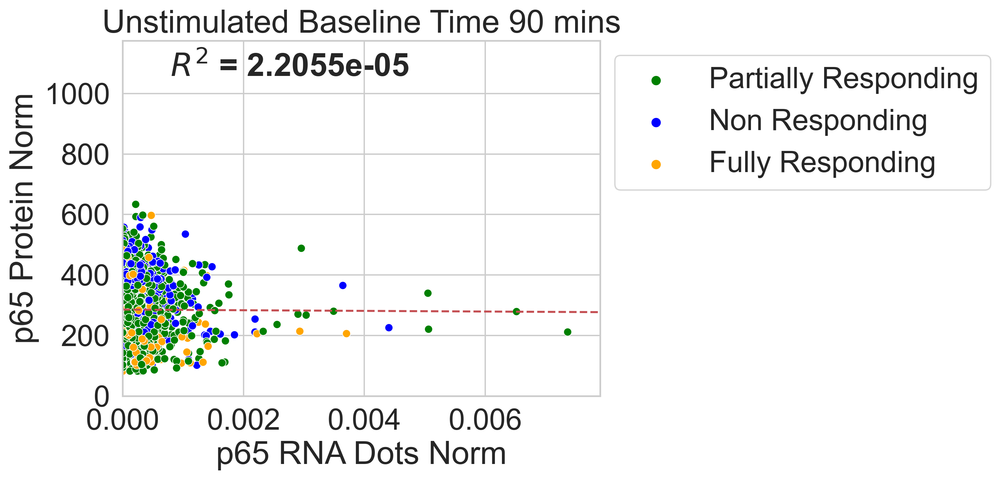

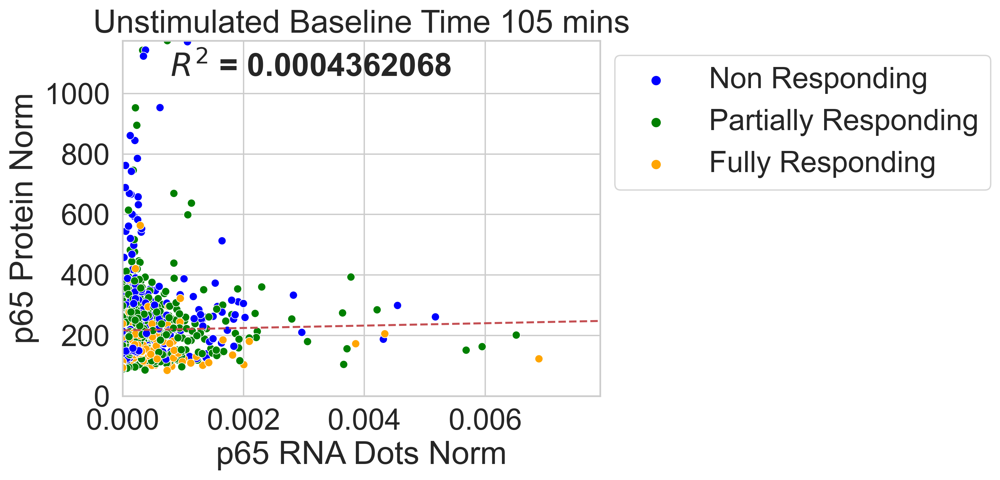

100%|██████████| 3/3 [01:09<00:00, 23.31s/it]


In [8]:
x = 'p65 RNA Dots Norm'
y = 'p65 Protein Norm'
hue = 'Stim'

# define colormap for stimulation levels
palette = {'Non Responding': 'blue', 
          'Partially Responding': 'green', 
          'Fully Responding': 'orange'}

for ii, drug in enumerate(tqdm(dfNorm['Drug'].unique())): # each drug

    dfDrug = dfNorm.loc[dfNorm['Drug'] == drug]

    for _, timeStamp in enumerate(dfDrug['TimeStamp'].unique()): # each unique timepoint
        
        dfTime = dfDrug.loc[dfDrug['TimeStamp'] == timeStamp]
        
        fig, ax = plt.subplots(dpi = 300)
        sns.scatterplot(data = dfTime, x = x, y = y, hue = hue, ax = ax, palette = palette)
        ax.set_title(drug + ' Time ' + str(timeStamp) + ' mins')
        
        # standardize axes limits
        ax.set_xlim(0, dfDrug[x].max())
        ax.set_ylim(0, dfDrug[y].max())
        
        # linear curve fit
        # p0 = [1, 1] # initial guess
        weights, _ = scipy.optimize.curve_fit(linFit, dfTime[x], dfTime[y])

        # plot linear fit
        yPred = linFit(dfTime[x], *weights)
        # plot line for entire domain
        domain = np.array(ax.get_xlim())
        sns.lineplot(x = domain, y = linFit(domain, *weights), 
                    label = '__Linear Fit', ls = '--', color = 'r', ax = ax)

        # R^2 coef
        r2 = r2_score(dfTime[y], yPred)
        ax.text(0.1, 0.9, '$R^{2}$ = ' + str(round(r2, 10)), transform = ax.transAxes, 
                fontsize = 24, fontweight = 'bold')
    #     # pearsons corr
    #     pearson, _ = scipy.stats.pearsonr(dfTime[x], dfTime[y])
    #     ax.text(0.1, 0.9, 'Pearson = ' + str(round(pearson, 10)), transform = ax.transAxes, 
    #             fontsize = 24, fontweight = 'bold')
            
        # move legend outside
        ax.legend(bbox_to_anchor = [1, 1], loc = 'upper left')
                
        # save fig
        saveFigLabelTime(fig, title=drug + '_Time_' + str(timeStamp) + 'mins' + '_Norm')
        plt.show()

# Plot lineplot of stim levels across time. Count drug vs control

# Read single cell data

In [9]:
dfCell = pd.read_hdf(dataPath / '04_bar_plots.h5',
                     key = 'df')
dfCell

,CellLabel,Stim,Drug,TimeStamp
0,1,Non Responding,TNFa,0
1,3,Partially Responding,TNFa,0
2,4,Non Responding,TNFa,0
3,5,Partially Responding,TNFa,0
4,6,Non Responding,TNFa,0
...,...,...,...,...
32,61882,Fully Responding,Unstimulated Baseline,105
33,61884,Fully Responding,Unstimulated Baseline,105
34,61897,Partially Responding,Unstimulated Baseline,105
35,61902,Fully Responding,Unstimulated Baseline,105


# Plot bar graphs of stimulated cells

In [10]:
# plot normalized
norm = dfCell.groupby(['Drug', 'TimeStamp', 'Stim']).agg({'CellLabel': 'nunique'})
norm.reset_index(drop = False, inplace = True)
norm = norm.pivot(index = ['Drug', 'TimeStamp'], columns = ['Stim'], values = 'CellLabel')
norm.fillna(0, inplace = True)

tot = norm.sum(axis = 1).values # total number of cells w/in each group
tot = tot[:, np.newaxis]

norm = norm / tot # normalize
norm.reset_index(drop = False, inplace = True)

# reformat
norm = norm.melt(id_vars = ['Drug', 'TimeStamp'], var_name = 'Stim', value_name = 'Cells')
norm

,Drug,TimeStamp,Stim,Cells
0,IL1B,0,Fully Responding,0.074387
1,IL1B,15,Fully Responding,0.606061
2,IL1B,30,Fully Responding,0.771429
3,IL1B,45,Fully Responding,0.763441
4,IL1B,60,Fully Responding,0.215728
...,...,...,...,...
67,Unstimulated Baseline,45,Partially Responding,0.639769
68,Unstimulated Baseline,60,Partially Responding,0.464774
69,Unstimulated Baseline,75,Partially Responding,0.608565
70,Unstimulated Baseline,90,Partially Responding,0.575949


## Bar graph normalized stimulated cell counts over time. Plot bidirectional bar plot with drug vs control

  0%|          | 0/3 [00:00<?, ?it/s]

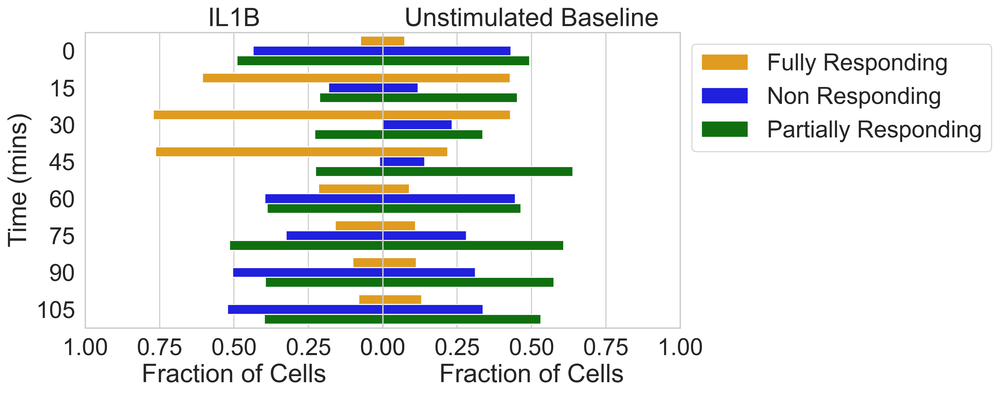

 33%|███▎      | 1/3 [00:02<00:05,  2.93s/it]

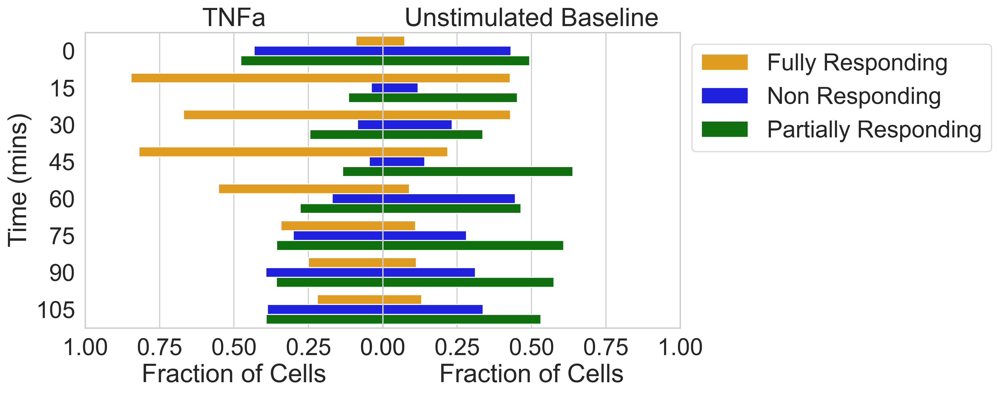

100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


In [11]:
# plot bar graph
y = 'TimeStamp'
x = 'Cells'
hue = 'Stim'

for ii, drug in enumerate(tqdm(norm['Drug'].unique())): # each drug

    if 'Unstimulated Baseline' in drug:
        continue

    # show drug 

    # fig, ax = plt.subplots(dpi = 300)
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5), dpi = 300, sharey=True, gridspec_kw={'wspace': 0})

    # control on right
    dfSub = norm.loc[norm['Drug'] == 'Unstimulated Baseline']
    sns.barplot(data = dfSub, ax = ax2, x = x, y = y, hue = hue, palette = palette, 
                orient='h', dodge=True)
    # ax2.yaxis.set_label_position('left')
    # ax2.set_ylabel('Time (mins)')
    ax2.tick_params(labelright=False, right=False)
    ax2.set_ylabel('')
    # ax2.tick_params(axis='y', labelright=True, right=True)
    ax2.set_title('Unstimulated Baseline')
    ax2.legend_.remove()  # remove the legend; the legend will be in ax1
    ax2.set_xlim(0, 1)  # set the x-axis limits
    ax2.set_xlabel('Fraction of Cells')

    # drug on left
    dfSub = norm.loc[norm['Drug'] == drug]
    sns.barplot(data = dfSub, ax = ax1, x = x, y = y, hue = hue, palette = palette, 
                orient='h', dodge=True)
    # ax1.set_ylabel('Fraction of Cells')
    # ax1.set_xlabel('Time (mins)')
    # ax1.set_title(drug + ' Cell Counts')
    ax1.legend(bbox_to_anchor = [2, 1], loc = 'upper left')
    ax1.set_xlim(0, 1)  # set the x-axis limits
    
    ax1.invert_xaxis()  # reverse the direction
    # ax1.tick_params(labelleft=False, left=False)
    # ax1.set_ylabel('')
    ax1.yaxis.set_label_position('left')
    ax1.set_ylabel('Time (mins)')
    ax1.set_title(drug)
    ax1.set_xlabel('Fraction of Cells')

    # save fig
    saveFigLabelTime(fig, title=drug + '_CellCounts_norm')
    plt.show()